# use pretrained Resnet model to generate latent space, use Conv_autoencoder to get latent space of other sensors

data: umineko 2018 back 1

In [1]:
import os

import matplotlib.pyplot as plt
# import numpy as np
# import os
# import matplotlib.pyplot as plt
# import pickle
# import pandas as pd
# from torch.utils.data import Dataset, DataLoader
# import torch
# import torch.nn as nn
# 
# from scipy.interpolate import interp1d
# import math
# from datetime import datetime
# from tqdm import tqdm
# from sklearn.manifold import TSNE
# 
# import pickle
import torch.optim as optim
# from utils import *
# from hubconf import load_weights
# from sslearning.models.accNet import Resnet
from umap import UMAP
import plotly.express as px
# from importlib.metadata import version, PackageNotFoundError

import pickle
import numpy as np
from tqdm import tqdm
import torch

from deepview.calculate_results.data.umineko_data import (
    read_umineko_data,
read_umineko_path,
extract_data_from_year_back,
label_dict,
get_accel_batch_data,
)

from deepview.calculate_results.models.utils import (
    Resnet,
load_weights,
MSEloss,
# torch,
AE_eval_time_series,
AE_train_time_series_resnet,
AE_train_time_series,
majority_value,
# np,
adjust_learning_rate,
# tqdm
Autoencoder3d,
Autoencoder3d_transf,
Autoencoder1d,
Autoencoder2d
)

In [2]:
back_label_path = r'D:\logbot-data\BioTaggerData\masterLabelsByOtsuka\animal_id.csv'
umi_root_path = r'D:\logbot-data\BioTaggerData\export\raw\umineko\v.1.0.0'
file_paths = read_umineko_path(umi_root_path)

year = '2018'
data_path = r'D:\code\DeepView\deepview\calculate_results\data\umineko_%s.npy'%year
if os.path.exists(data_path):
    tmp = np.load(data_path, allow_pickle='TRUE').item()
    df_list = tmp['raw_data']
    df_clean_list = tmp['labeled_data']
    
selected_df, selected_clean_df = (
        extract_data_from_year_back(df_list, df_clean_list, 1))

selected_df['label_id'] = selected_df['label'].map(label_dict)
selected_clean_df['label_id'] = selected_clean_df['label'].map(label_dict)

# 将df_list没有标签的位置赋值-2，标记灰色，其他label正常标记。观察是否有label的标记能在不同灰色cluster中
# Replace NaN with -2 in column A
selected_df['label_id'] = selected_df['label_id'].fillna(-2)

device = 'cuda'
len_sw = 300
sensor_type = 'accel'
train_loader = get_accel_batch_data(selected_df, 
                                    len_sw, 
                                    batch_size=512, 
                                    device=device)

C:\Users\dell\AppData\Local\Temp\ipykernel_39784\3669579838.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_df['label_id'] = selected_df['label'].map(label_dict)
C:\Users\dell\AppData\Local\Temp\ipykernel_39784\3669579838.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  selected_clean_df['label_id'] = selected_clean_df['label'].map(label_dict)
C:\Users\dell\AppData\Local\Temp\ipykernel_39784\3669579838.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [3]:
model = Autoencoder3d_transf()
model = model.to(device)
# 
# full_model_path = r'D:\code\DeepView\deepview\calculate_results\data\Resnet_ssl_conv_pretrain_epoch79_datalen300_accel_labeldata.pth'
# if torch.cuda.is_available():
#     model.load_state_dict(torch.load(full_model_path, weights_only=False))
# else:
#     model.load_state_dict(torch.load(full_model_path, weights_only=False, map_location=torch.device('cpu')))



In [4]:
criterion = MSEloss()
criterion = criterion.to(device)

learning_rate = 0.0001
optimizer = optim.Adam(
    model.parameters(), lr=learning_rate, amsgrad=True
)
optimizer = optim.Adam(
            model.parameters(), lr=learning_rate, amsgrad=True
        )
lambda1 = lambda epoch: 1.0**epoch
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)

## reconstruction result before training

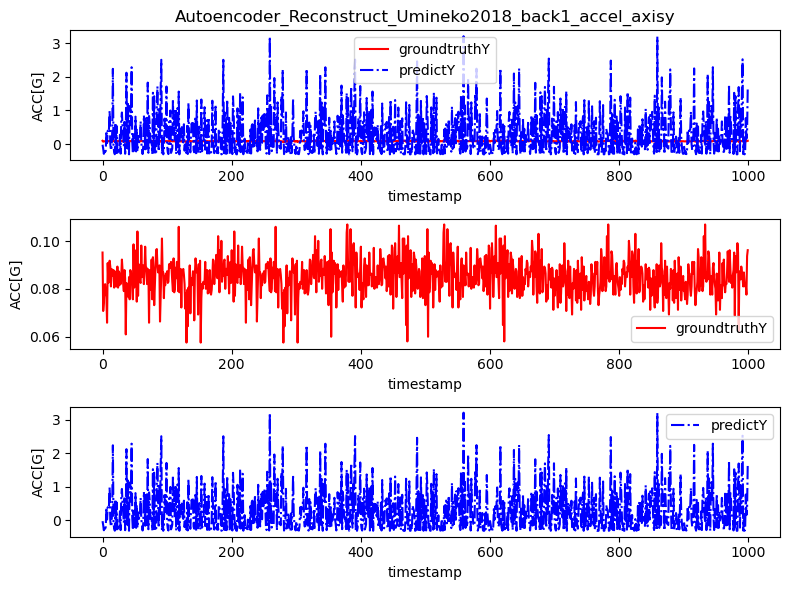

In [5]:
# reconstruction result
representation_list, sample_list, pred_list, label_list = \
            AE_eval_time_series(train_loader, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list)
repre_reshape = repre_concat.reshape(repre_concat.shape[0], -1)

sample_concat = np.concatenate(sample_list)
# sample_reshape = sample_concat.reshape(-1, 3)
sample_concat = sample_concat.transpose(0,2,1)
sample_reshape = sample_concat.reshape(-1, sample_concat.shape[-1])

pred_concat = np.concatenate(pred_list)
# pred_reshape = pred_concat.reshape(-1, 3)
pred_concat = pred_concat.transpose(0, 2, 1)
pred_reshape = pred_concat.reshape(-1, pred_concat.shape[-1])

label_concat = np.concatenate(label_list)
label_concat_vote = majority_value(label_concat)
# label_concat_vote.shape

start, end = 1000, 2000
fig, axes = plt.subplots(3, 1, figsize=(8, 6)) 
axes[0].plot(sample_reshape[start:end, 1], 'r', label='groundtruthY')
axes[0].plot(pred_reshape[start:end, 1], 'b-.', label='predictY')
axes[0].set_title('Autoencoder_Reconstruct_Umineko2018_back1_accel_axisy')
axes[0].set_xlabel('timestamp')
axes[0].set_ylabel('ACC[G]')
axes[0].legend()

axes[1].plot(sample_reshape[start:end, 1], 'r', label='groundtruthY')
# axes[1].plot(pred_reshape[10000:length, 1], 'b-.', label='predictY')
# axes[1].set_title('ResNet_SSL_pretrained_Reconstruct_Umineko2018_back1')
axes[1].set_xlabel('timestamp')
axes[1].set_ylabel('ACC[G]')
axes[1].legend()

# axes[2].plot(sample_reshape[10000:length, 1], 'r', label='groundtruthY')
axes[2].plot(pred_reshape[start:end, 1], 'b-.', label='predictY')
# axes[2].set_title('ResNet_SSL_pretrained_Reconstruct_Umineko2018_back1')
axes[2].set_xlabel('timestamp')
axes[2].set_ylabel('ACC[G]')
axes[2].legend()

# Adjust layout
plt.tight_layout()
# Show the figure
plt.show()

In [6]:
 # training
start_epoch = 0
num_epochs = 1000
# lr = 0.0001
training_loss = []
for epoch in tqdm(range(start_epoch, num_epochs)):

    learning_rate = adjust_learning_rate(
        learning_rate, optimizer, epoch, p_scheduler='cosine', p_epochs=num_epochs)

    losses = AE_train_time_series_resnet(train_loader, model, criterion, optimizer, epoch, scheduler, device)
    training_loss.append(losses.val)
    # if (epoch % 10 == 0) or (epoch == num_epochs - 1):
    #     print('loss of the ' + str(epoch) + '-th training epoch is :' + losses.__str__())


print('Saving model at: ' + 'AE_reconstruct_epoch%s' % str(epoch) \
      + '_datalen%s_' % str(len_sw) +sensor_type+ '.pth')
torch.save(model.state_dict(), 'AE_reconstruct_epoch%s' % str(epoch) + \
           '_datalen%s_' % str(len_sw) +sensor_type+ '.pth')

100%|██████████| 1000/1000 [25:51<00:00,  1.55s/it]


Saving model at: AE_reconstruct_epoch999_datalen300_accel.pth


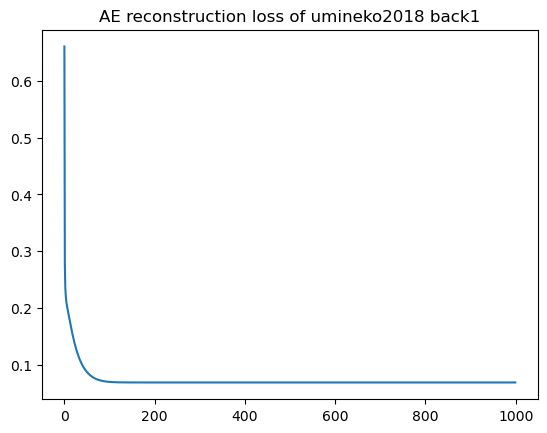

In [7]:
plt.plot(training_loss)
plt.title('AE reconstruction loss of umineko2018 back1')
plt.show()

In [8]:
# reconstruction result

representation_list, sample_list, pred_list, label_list = \
            AE_eval_time_series(train_loader, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list)
repre_reshape = repre_concat.reshape(repre_concat.shape[0], -1)

sample_concat = np.concatenate(sample_list)
# sample_reshape = sample_concat.reshape(-1, 3)
sample_concat = sample_concat.transpose(0,2,1)
sample_reshape = sample_concat.reshape(-1, sample_concat.shape[-1])

pred_concat = np.concatenate(pred_list)
# pred_reshape = pred_concat.reshape(-1, 3)
pred_concat = pred_concat.transpose(0, 2, 1)
pred_reshape = pred_concat.reshape(-1, pred_concat.shape[-1])

label_concat = np.concatenate(label_list)
label_concat_vote = majority_value(label_concat)
# label_concat_vote.shape


## reconstruction after training

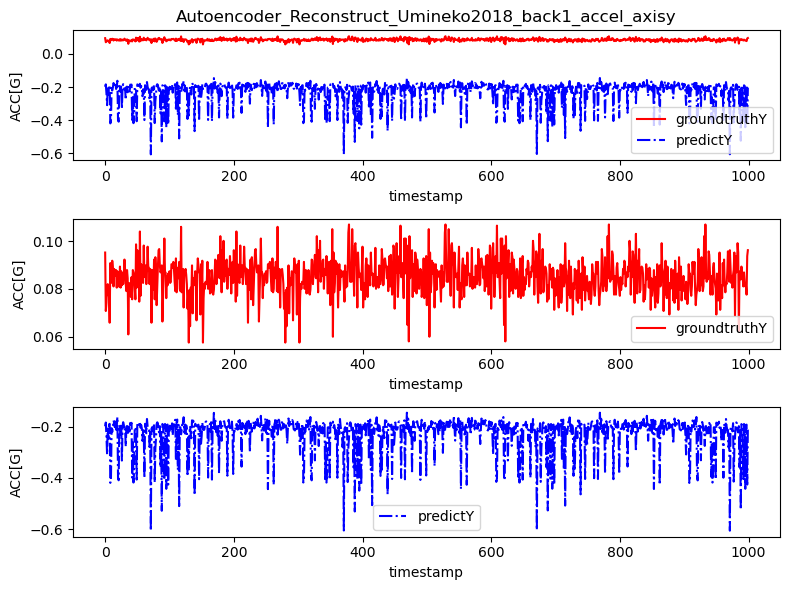

In [9]:
# reconstruction result
representation_list, sample_list, pred_list, label_list = \
            AE_eval_time_series(train_loader, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list)
repre_reshape = repre_concat.reshape(repre_concat.shape[0], -1)

sample_concat = np.concatenate(sample_list)
# sample_reshape = sample_concat.reshape(-1, 3)
sample_concat = sample_concat.transpose(0,2,1)
sample_reshape = sample_concat.reshape(-1, sample_concat.shape[-1])

pred_concat = np.concatenate(pred_list)
# pred_reshape = pred_concat.reshape(-1, 3)
pred_concat = pred_concat.transpose(0, 2, 1)
pred_reshape = pred_concat.reshape(-1, pred_concat.shape[-1])

label_concat = np.concatenate(label_list)
label_concat_vote = majority_value(label_concat)
# label_concat_vote.shape

start, end = 1000, 2000
fig, axes = plt.subplots(3, 1, figsize=(8, 6)) 
axes[0].plot(sample_reshape[start:end, 1], 'r', label='groundtruthY')
axes[0].plot(pred_reshape[start:end, 1], 'b-.', label='predictY')
axes[0].set_title('Autoencoder_Reconstruct_Umineko2018_back1_accel_axisy')
axes[0].set_xlabel('timestamp')
axes[0].set_ylabel('ACC[G]')
axes[0].legend()

axes[1].plot(sample_reshape[start:end, 1], 'r', label='groundtruthY')
# axes[1].plot(pred_reshape[10000:length, 1], 'b-.', label='predictY')
# axes[1].set_title('ResNet_SSL_pretrained_Reconstruct_Umineko2018_back1')
axes[1].set_xlabel('timestamp')
axes[1].set_ylabel('ACC[G]')
axes[1].legend()

# axes[2].plot(sample_reshape[10000:length, 1], 'r', label='groundtruthY')
axes[2].plot(pred_reshape[start:end, 1], 'b-.', label='predictY')
# axes[2].set_title('ResNet_SSL_pretrained_Reconstruct_Umineko2018_back1')
axes[2].set_xlabel('timestamp')
axes[2].set_ylabel('ACC[G]')
axes[2].legend()

# Adjust layout
plt.tight_layout()
# Show the figure
plt.show()

# latent representation

In [10]:

umap_3d = UMAP(n_components=3)

proj_3d_gyro = umap_3d.fit_transform(repre_reshape)

# set point size 
point_size = np.ones(proj_3d_gyro.shape[0]) * 1
grey_idx = np.where(label_concat_vote==-2)[0]
point_size[grey_idx] = 0.5

fig_3d = px.scatter_3d(
    proj_3d_gyro, x=0, y=1, z=2,
    color=label_concat_vote.astype(str),  
    labels={'color': 'activity'},
    # color_discrete_map={ '-2.0': ('rgba(239, 239, 240, 1)')},
    color_discrete_map={ '-2.0': 'grey'},
    size=point_size
)

# Update transparency for traces where activity is '-2.0'
fig_3d.for_each_trace(lambda trace: trace.update(marker=dict(opacity=0.5)) if trace.name == '-2.0' else ())

fig_3d.update_traces(marker=dict(line=dict(width=0)))  # remove boundary of point

fig_3d.show()

In [11]:
# only show the activities of -2 and 0

# find indices
value_idx = np.where((label_concat_vote==-2) | (label_concat_vote==0))[0]

fig_3d = px.scatter_3d(
    proj_3d_gyro[value_idx, :], x=0, y=1, z=2,
    color=label_concat_vote[value_idx].astype(str),  
    labels={'color': 'activity'},
    # color_discrete_map={ '-2.0': ('rgba(239, 239, 240, 1)')},
    color_discrete_map={ '-2.0': 'grey'},
    size=point_size[value_idx]
)

# Update transparency for traces where activity is '-2.0'
fig_3d.for_each_trace(lambda trace: trace.update(marker=dict(opacity=0.5)) if trace.name == '-2.0' else ())

fig_3d.update_traces(marker=dict(line=dict(width=0)))  # remove boundary of point

fig_3d.show()

In [12]:
# only show the activities of -2 and 0

# find indices
value_idx = np.where((label_concat_vote==-2) | (label_concat_vote==14))[0]
# proj_3d_gyro[value_idx, :]
# label_concat_vote[value_idx]
# point_size[value_idx]

fig_3d = px.scatter_3d(
    proj_3d_gyro[value_idx, :], x=0, y=1, z=2,
    color=label_concat_vote[value_idx].astype(str),  
    labels={'color': 'activity'},
    # color_discrete_map={ '-2.0': ('rgba(239, 239, 240, 1)')},
    color_discrete_map={ '-2.0': 'grey'},
    size=point_size[value_idx]
)

# Update transparency for traces where activity is '-2.0'
fig_3d.for_each_trace(lambda trace: trace.update(marker=dict(opacity=0.5)) if trace.name == '-2.0' else ())

fig_3d.update_traces(marker=dict(line=dict(width=0)))  # remove boundary of point

fig_3d.show()

In [13]:
# only show the activities of -2 and 0

# find indices
value_idx = np.where((label_concat_vote==-2) | (label_concat_vote==4))[0]
# proj_3d_gyro[value_idx, :]
# label_concat_vote[value_idx]
# point_size[value_idx]

fig_3d = px.scatter_3d(
    proj_3d_gyro[value_idx, :], x=0, y=1, z=2,
    color=label_concat_vote[value_idx].astype(str),  
    labels={'color': 'activity'},
    # color_discrete_map={ '-2.0': ('rgba(239, 239, 240, 1)')},
    color_discrete_map={ '-2.0': 'grey'},
    size=point_size[value_idx]
)

# Update transparency for traces where activity is '-2.0'
fig_3d.for_each_trace(lambda trace: trace.update(marker=dict(opacity=0.5)) if trace.name == '-2.0' else ())

fig_3d.update_traces(marker=dict(line=dict(width=0)))  # remove boundary of point

fig_3d.show()

# back=0

In [14]:
back_label_path = r'D:\logbot-data\BioTaggerData\masterLabelsByOtsuka\animal_id.csv'
umi_root_path = r'D:\logbot-data\BioTaggerData\export\raw\umineko\v.1.0.0'
file_paths = read_umineko_path(umi_root_path)

year = '2018'
data_path = r'D:\code\DeepView\deepview\calculate_results\data\umineko_%s.npy'%year
if os.path.exists(data_path):
    tmp = np.load(data_path, allow_pickle='TRUE').item()
    df_list = tmp['raw_data']
    df_clean_list = tmp['labeled_data']
    
selected_df, selected_clean_df = (
        extract_data_from_year_back(df_list, df_clean_list, 0))

selected_df['label_id'] = selected_df['label'].map(label_dict)
selected_clean_df['label_id'] = selected_clean_df['label'].map(label_dict)

# 将df_list没有标签的位置赋值-2，标记灰色，其他label正常标记。观察是否有label的标记能在不同灰色cluster中
# Replace NaN with -2 in column A
selected_df['label_id'] = selected_df['label_id'].fillna(-2)

device = 'cuda'
len_sw = 300
sensor_type = 'accel'
train_loader = get_accel_batch_data(selected_df, 
                                    len_sw, 
                                    batch_size=512, 
                                    device=device)

C:\Users\dell\AppData\Local\Temp\ipykernel_39784\4107527194.py:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\dell\AppData\Local\Temp\ipykernel_39784\4107527194.py:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\dell\AppData\Local\Temp\ipykernel_39784\4107527194.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [15]:
model = Autoencoder3d_transf()
model = model.to(device)

In [16]:
criterion = MSEloss()
criterion = criterion.to(device)

learning_rate = 0.0001
optimizer = optim.Adam(
    model.parameters(), lr=learning_rate, amsgrad=True
)
optimizer = optim.Adam(
            model.parameters(), lr=learning_rate, amsgrad=True
        )
lambda1 = lambda epoch: 1.0**epoch
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambda1)

In [17]:
 # training
start_epoch = 0
num_epochs = 500
# lr = 0.0001

for epoch in tqdm(range(start_epoch, num_epochs)):

    learning_rate = adjust_learning_rate(
        learning_rate, optimizer, epoch, p_scheduler='cosine', p_epochs=num_epochs)

    losses = AE_train_time_series_resnet(train_loader, model, criterion, optimizer, epoch, scheduler, device)
    if (epoch % 10 == 0) or (epoch == num_epochs - 1):
        print('loss of the ' + str(epoch) + '-th training epoch is :' + losses.__str__())

# print('Saving model at: ' + 'Resnet_ssl_pretrain_epoch%s' % str(epoch) \
#       + '_datalen%s_' % str(len_sw) +sensor_type+ '.pth')
# torch.save(model.state_dict(), 'Resnet_ssl_pretrain_epoch%s' % str(epoch) + \
#            '_datalen%s_' % str(len_sw) +sensor_type+ '.pth')

print('Saving model at: ' + 'AE_ssl_pretrain_epoch%s_back0' % str(epoch) \
      + '_datalen%s_' % str(len_sw) +sensor_type+ '.pth')
torch.save(model.state_dict(), 'AE_ssl_pretrain_epoch%s_back0' % str(epoch) + \
           '_datalen%s_' % str(len_sw) +sensor_type+ '.pth')

  0%|          | 1/500 [00:05<45:57,  5.53s/it]

loss of the 0-th training epoch is :Loss 3.5733e-01 (7.0875e-01)


  2%|▏         | 11/500 [00:58<43:00,  5.28s/it]

loss of the 10-th training epoch is :Loss 7.4473e-02 (1.5849e-01)


  4%|▍         | 21/500 [01:45<36:44,  4.60s/it]

loss of the 20-th training epoch is :Loss 2.9886e-02 (1.1423e-01)


  6%|▌         | 31/500 [02:34<38:15,  4.89s/it]

loss of the 30-th training epoch is :Loss 2.2550e-02 (1.0659e-01)


  8%|▊         | 41/500 [03:22<37:22,  4.88s/it]

loss of the 40-th training epoch is :Loss 2.1443e-02 (1.0492e-01)


 10%|█         | 51/500 [04:12<38:50,  5.19s/it]

loss of the 50-th training epoch is :Loss 2.1362e-02 (1.0438e-01)


 12%|█▏        | 61/500 [05:06<39:02,  5.34s/it]

loss of the 60-th training epoch is :Loss 2.1431e-02 (1.0413e-01)


 14%|█▍        | 71/500 [05:56<35:00,  4.90s/it]

loss of the 70-th training epoch is :Loss 2.1504e-02 (1.0398e-01)


 16%|█▌        | 81/500 [06:46<34:13,  4.90s/it]

loss of the 80-th training epoch is :Loss 2.1558e-02 (1.0389e-01)


 18%|█▊        | 91/500 [07:36<32:29,  4.77s/it]

loss of the 90-th training epoch is :Loss 2.1587e-02 (1.0384e-01)


 20%|██        | 101/500 [08:25<33:12,  4.99s/it]

loss of the 100-th training epoch is :Loss 2.1599e-02 (1.0381e-01)


 22%|██▏       | 111/500 [09:14<32:31,  5.02s/it]

loss of the 110-th training epoch is :Loss 2.1604e-02 (1.0380e-01)


 24%|██▍       | 121/500 [10:05<32:50,  5.20s/it]

loss of the 120-th training epoch is :Loss 2.1607e-02 (1.0380e-01)


 26%|██▌       | 131/500 [10:58<33:05,  5.38s/it]

loss of the 130-th training epoch is :Loss 2.1608e-02 (1.0380e-01)


 28%|██▊       | 141/500 [11:52<31:54,  5.33s/it]

loss of the 140-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 30%|███       | 151/500 [12:45<31:17,  5.38s/it]

loss of the 150-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 32%|███▏      | 161/500 [13:38<30:32,  5.40s/it]

loss of the 160-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 34%|███▍      | 171/500 [15:43<48:50,  8.91s/it]  

loss of the 170-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 36%|███▌      | 181/500 [16:36<28:59,  5.45s/it]

loss of the 180-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 38%|███▊      | 191/500 [17:29<27:18,  5.30s/it]

loss of the 190-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 40%|████      | 201/500 [18:22<26:07,  5.24s/it]

loss of the 200-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 42%|████▏     | 211/500 [19:15<25:48,  5.36s/it]

loss of the 210-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 44%|████▍     | 221/500 [20:08<24:43,  5.32s/it]

loss of the 220-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 46%|████▌     | 231/500 [21:02<24:06,  5.38s/it]

loss of the 230-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 48%|████▊     | 241/500 [21:55<23:18,  5.40s/it]

loss of the 240-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 50%|█████     | 251/500 [22:48<22:09,  5.34s/it]

loss of the 250-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 52%|█████▏    | 261/500 [23:41<20:53,  5.25s/it]

loss of the 260-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 54%|█████▍    | 271/500 [24:38<20:38,  5.41s/it]

loss of the 270-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 56%|█████▌    | 281/500 [25:31<19:29,  5.34s/it]

loss of the 280-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 58%|█████▊    | 291/500 [26:25<18:40,  5.36s/it]

loss of the 290-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 60%|██████    | 301/500 [27:19<17:46,  5.36s/it]

loss of the 300-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 62%|██████▏   | 311/500 [28:12<16:34,  5.26s/it]

loss of the 310-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 64%|██████▍   | 321/500 [29:05<16:02,  5.38s/it]

loss of the 320-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 66%|██████▌   | 331/500 [29:59<15:07,  5.37s/it]

loss of the 330-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 68%|██████▊   | 341/500 [30:52<13:55,  5.25s/it]

loss of the 340-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 70%|███████   | 351/500 [31:45<13:03,  5.26s/it]

loss of the 350-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 72%|███████▏  | 361/500 [32:42<14:42,  6.35s/it]

loss of the 360-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 74%|███████▍  | 371/500 [33:35<11:35,  5.39s/it]

loss of the 370-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 76%|███████▌  | 381/500 [34:28<10:33,  5.32s/it]

loss of the 380-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 78%|███████▊  | 391/500 [35:22<09:31,  5.25s/it]

loss of the 390-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 80%|████████  | 401/500 [36:16<08:44,  5.30s/it]

loss of the 400-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 82%|████████▏ | 411/500 [37:09<07:54,  5.34s/it]

loss of the 410-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 84%|████████▍ | 421/500 [38:03<07:01,  5.33s/it]

loss of the 420-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 86%|████████▌ | 431/500 [38:57<06:16,  5.45s/it]

loss of the 430-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 88%|████████▊ | 441/500 [39:52<05:15,  5.34s/it]

loss of the 440-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 90%|█████████ | 451/500 [40:45<04:24,  5.39s/it]

loss of the 450-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 92%|█████████▏| 461/500 [41:45<04:00,  6.16s/it]

loss of the 460-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 94%|█████████▍| 471/500 [42:39<02:36,  5.38s/it]

loss of the 470-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 96%|█████████▌| 481/500 [43:34<01:44,  5.49s/it]

loss of the 480-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


 98%|█████████▊| 491/500 [44:29<00:48,  5.43s/it]

loss of the 490-th training epoch is :Loss 2.1610e-02 (1.0380e-01)


100%|██████████| 500/500 [45:17<00:00,  5.43s/it]

loss of the 499-th training epoch is :Loss 2.1610e-02 (1.0380e-01)
Saving model at: AE_ssl_pretrain_epoch499_back0_datalen300_accel.pth


In [18]:
# reconstruction result

representation_list, sample_list, pred_list, label_list = \
            AE_eval_time_series(train_loader, model, device)

# tsne latent representation to shape=(2, len) PCA降维到形状为 (2, len)
repre_concat = np.concatenate(representation_list)
repre_reshape = repre_concat.reshape(repre_concat.shape[0], -1)

sample_concat = np.concatenate(sample_list)
# sample_reshape = sample_concat.reshape(-1, 3)
sample_concat = sample_concat.transpose(0,2,1)
sample_reshape = sample_concat.reshape(-1, sample_concat.shape[-1])

pred_concat = np.concatenate(pred_list)
# pred_reshape = pred_concat.reshape(-1, 3)
pred_concat = pred_concat.transpose(0, 2, 1)
pred_reshape = pred_concat.reshape(-1, pred_concat.shape[-1])

label_concat = np.concatenate(label_list)
label_concat_vote = majority_value(label_concat)
# label_concat_vote.shape


In [19]:

umap_3d = UMAP(n_components=3)

proj_3d_gyro = umap_3d.fit_transform(repre_reshape)

# set point size 
point_size = np.ones(proj_3d_gyro.shape[0]) * 1
grey_idx = np.where(label_concat_vote==-2)[0]
point_size[grey_idx] = 0.5

fig_3d = px.scatter_3d(
    proj_3d_gyro, x=0, y=1, z=2,
    color=label_concat_vote.astype(str),  
    labels={'color': 'activity'},
    # color_discrete_map={ '-2.0': ('rgba(239, 239, 240, 1)')},
    color_discrete_map={ '-2.0': 'grey'},
    size=point_size
)

# Update transparency for traces where activity is '-2.0'
fig_3d.for_each_trace(lambda trace: trace.update(marker=dict(opacity=0.5)) if trace.name == '-2.0' else ())

fig_3d.update_traces(marker=dict(line=dict(width=0)))  # remove boundary of point

fig_3d.show()